# Creating encoders based on 100000 z vectors

In [1]:
import os
from pathlib import Path
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

from models.generator import load_generator

import torch
torch.random.manual_seed(0)

VECTORS_PATH = '/media/pawel/DATA/tmp/freddie_mercuries/en_face/all_vectors'
Z_SHAPE = 256

## Importing the data

In [2]:
def import_and_stack_100000_vectors():
    pathnames = sorted(Path(VECTORS_PATH).rglob('*.npy'))
    vectors = [np.load(pathname) for pathname in pathnames]
    stacked_vectors = np.vstack(vectors)
    
    assert stacked_vectors.shape == (100000, Z_SHAPE), f"stacked_vectors.shape = {stacked_vectors.shape}, but should be (100000, {Z_SHAPE})"
    
    return stacked_vectors
    
    
def get_data():
    permutation_indices = np.load("permuted_100000.npy")
    
    Z = import_and_stack_100000_vectors()
    Y = np.load("../z-to-param/data/outvec.npy")[permutation_indices]
    
    
    return Z, Y

Z, Y = get_data()

Z.shape, Y.shape

((100000, 256), (100000, 5))

## Is data sensible?

Compare data in z with  G(z) and Y. Does it make sense?

In [3]:
def numpy_to_tensor(array):
    return torch.tensor(array, dtype=torch.float32)



def generate_images(generator, zs):
    with torch.no_grad():
        zs_tensor = numpy_to_tensor(zs)
        generated = generator(zs_tensor)
        return generated



In [4]:
    
generator = load_generator()
test_generated_images = generate_images(generator, Z[:10])
test_generated_images.shape

torch.Size([10, 3, 256, 256])

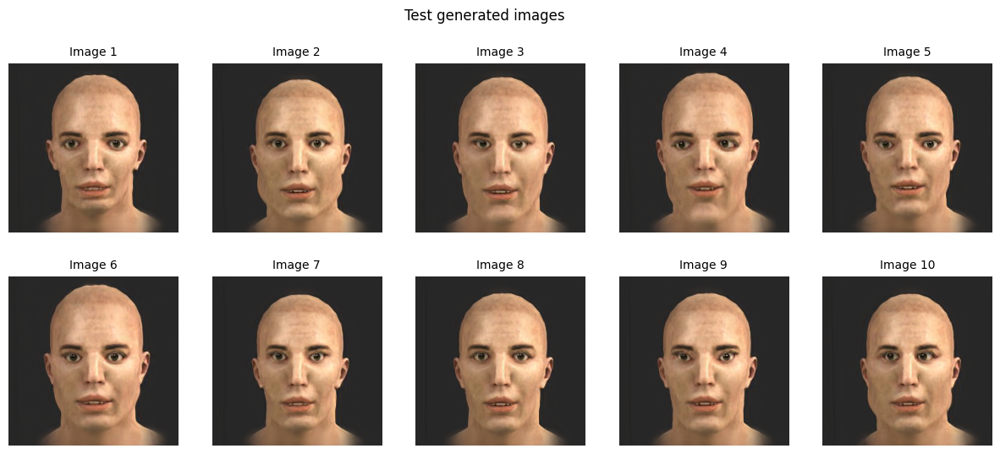

In [5]:
def prepare_images_for_plot(images: torch.tensor) -> np.ndarray:
    return images.detach().cpu().clamp_(0, 1).permute(0, 2, 3, 1).numpy()


def plot_images_grid(images: list, rows: int, cols: int, figsize: tuple = None, title: str = None, subtitles: list[str] = None) -> None:
    figsize = (cols * 3, rows * 3) if figsize is None else figsize
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    fig.suptitle(title) if title is not None else None
    
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(subtitles[i]) if subtitles is not None else None
        ax.axis('off')
        ax.title.set_fontsize(10)  # Set the font size for subtitles
        
    plt.show()
    
images_as_array = prepare_images_for_plot(test_generated_images)
plot_images_grid(images_as_array, 2, 5, title="Test generated images", subtitles=[f"Image {i+1}" for i in range(10)])

In [6]:
def format_label(label):
    names = label.split("_")[1:]
    incipits = [name[0] for name in names]
    return "".join(incipits)


position_to_label = {0: "gene_jaw_height", 1: "gene_jaw_width", 2: "gene_eye_angle", 3: "gene_eye_height", 4: "gene_eye_distance"}

def create_labels(Y):
    return [ ("".join([f"{format_label(label_i)}:{round(y_i, 2)}" for y_i, label_i in zip(y, position_to_label.values())])) for y in Y]

test_labels = create_labels(Y[:10])


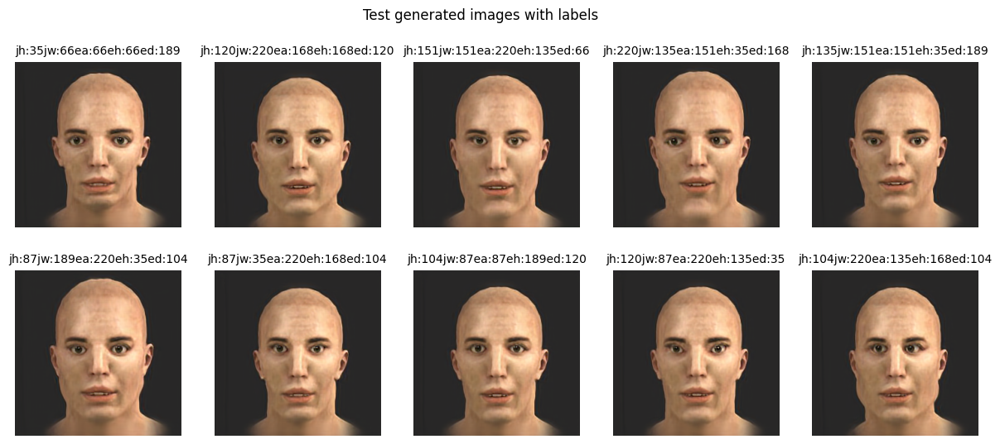

In [7]:
plot_images_grid(images_as_array, 2, 5, title="Test generated images with labels", subtitles=test_labels)

It looks like most of the parameters beside the "eye angle" one are pretty close to what is on the image. There are sometimes problems with eye distance. It will be beneficial to check how do the encoders perform based on a given parameter.

## Validation and test set

They will be taken from previous data. Hope they are not correlated with the training set. 

In [8]:
def get_validation_and_test_data():
    VALIDATION_AND_TEST_Z_PATH = "/media/pawel/DATA/tmp/freddie_mercuries/en_face/new_vectors"
    packages_paths = [path for path in Path(VALIDATION_AND_TEST_Z_PATH).rglob('*.npy')]
    assert len(packages_paths) != 0, f"No packages found in {VALIDATION_AND_TEST_Z_PATH}"
    
    validation_range = (90, 100)
    test_range = (100, 110)
    validation_package_paths = sorted(list(packages_paths)[validation_range[0]:validation_range[1]])
    test_package_paths = sorted(list(packages_paths)[test_range[0]:test_range[1]])
    
    Z_validation = np.vstack([np.load(path) for path in validation_package_paths])
    Z_test = np.vstack([np.load(path) for path in test_package_paths])
    
    permutation_indices = np.load("permuted_100000.npy")
    Y_all = np.load("../z-to-param/data/outvec.npy")[permutation_indices]
    Y_validation = Y_all[validation_range[0]*100:validation_range[1]*100]
    Y_test = Y_all[test_range[0]*100:test_range[1]*100]
    
    return (Z_validation, Y_validation), (Z_test, Y_test)
    
(Z_val, Y_val), (Z_test, Y_test) = get_validation_and_test_data()
Z_val.shape, Y_val.shape, Z_test.shape, Y_test.shape

((1000, 256), (1000, 5), (1000, 256), (1000, 5))

In [9]:
random_indicies = np.random.randint(0, Z_val.shape[0], 20)
print(random_indicies)

val_images_sample = prepare_images_for_plot(generate_images(generator, Z_val[random_indicies]))
test_images_sample = prepare_images_for_plot(generate_images(generator, Z_test[random_indicies]))
labels_val_sample = [ ("".join([f"{format_label(label_i)}:{round(y_i, 2)}" for y_i, label_i in zip(y, position_to_label.values())])) for y in Y_val[random_indicies]]
labels_test_sample = [ ("".join([f"{format_label(label_i)}:{round(y_i, 2)}" for y_i, label_i in zip(y, position_to_label.values())])) for y in Y_test[random_indicies]]


[705 429 848 474  51 337 973 151 896  77  95 332 276 921 196 546 613 429
 825 490]


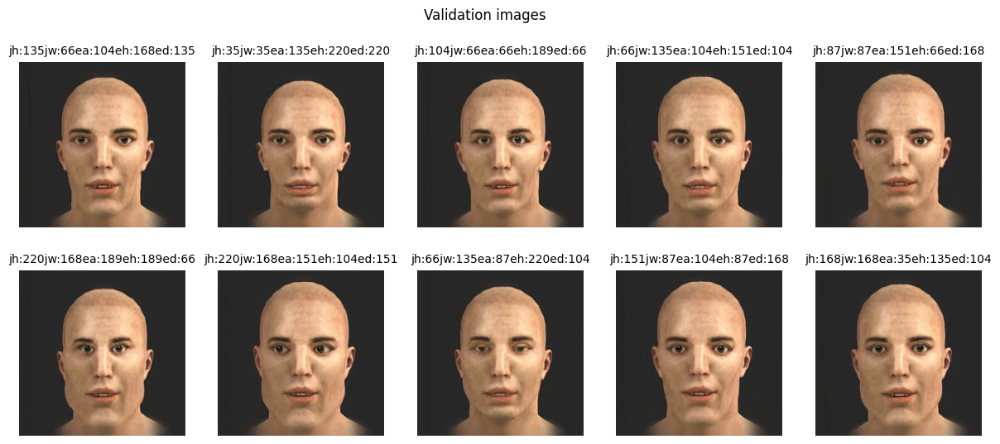

In [10]:
plot_images_grid(val_images_sample, 2, 5, title="Validation images", subtitles=labels_val_sample)

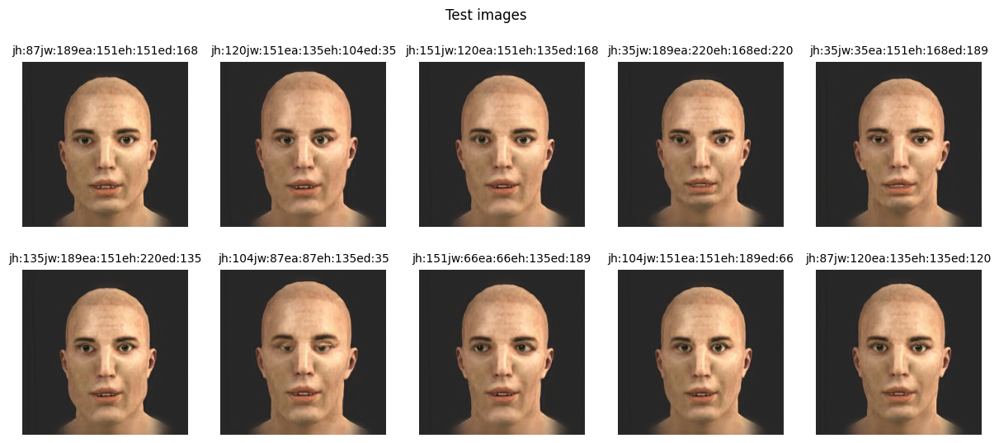

In [12]:
plot_images_grid(test_images_sample, 2, 5, title="Test images", subtitles=labels_test_sample)

This data is shit. I'm a little embarassed because backpropagation does not always converge to probable solutions. We can see that if we add the reference photos.

In [13]:
def load_reference_photos():
    REFERENCE_PHOTOS_PATH = "/media/pawel/DATA/tmp/freddie_mercuries/en_face/aligned"
    permutation_indicies = np.load("permuted_100000.npy")
    paths = np.array(sorted([path for path in Path(REFERENCE_PHOTOS_PATH).rglob("*.jpg")]))[permutation_indicies]
    assert len(paths) == 100000, f"Number of photos should be equal to 100000 but is {len(paths)}"
    
    paths_shortened = paths[:11500]    # loading only 11500 photos because my laptop cannot handle more
    X_permuted = np.array([Image.open(path) for path in paths_shortened])
    
    return X_permuted
    
X_reference = load_reference_photos()

In [14]:
X_reference_validation = X_reference[90*100:100*100]
X_reference_test = X_reference[100*100:110*100]

X_reference_validation_sample = [X_reference_validation[i] for i in random_indicies]
X_reference_test_sample = [X_reference_test[i] for i in random_indicies]

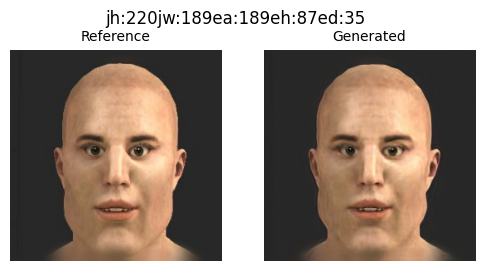

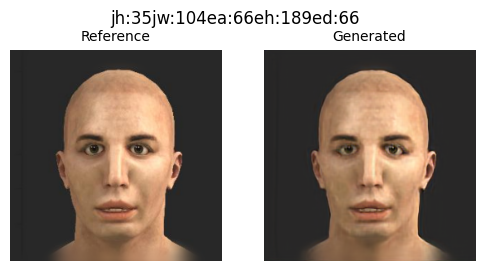

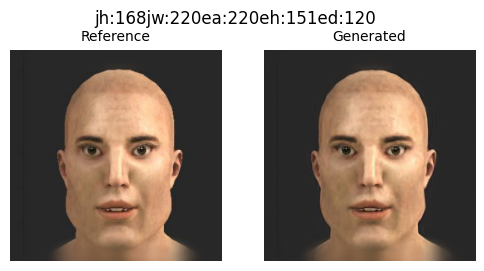

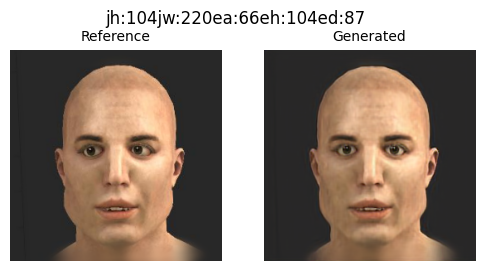

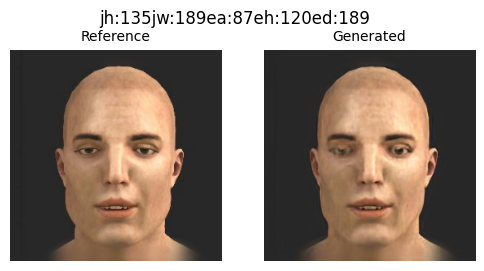

...

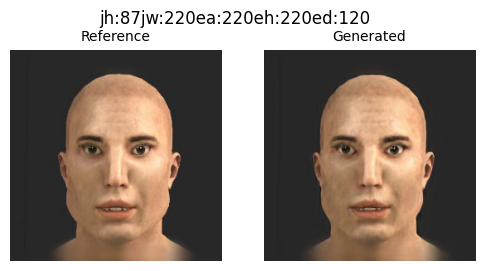

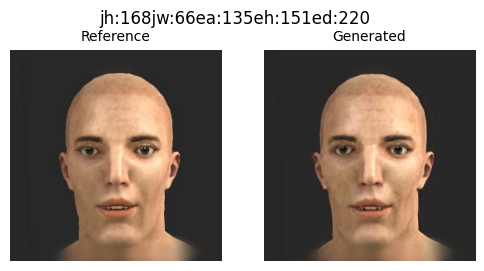

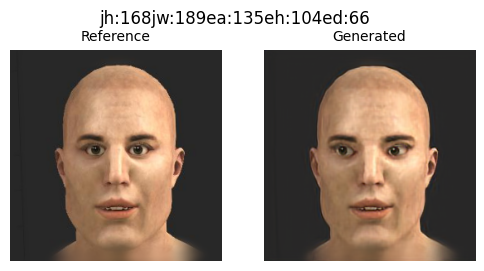

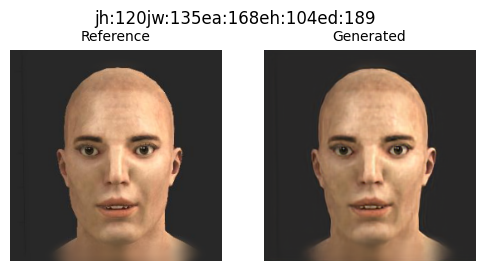

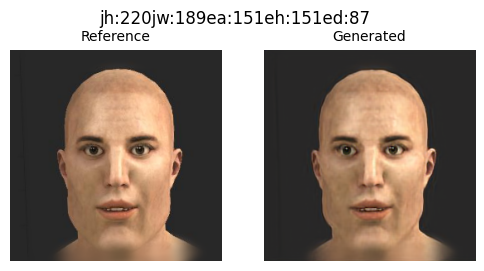

In [15]:
for x_ref, g_z, y_sample in zip(X_reference_validation_sample, val_images_sample, labels_val_sample):
    plot_images_grid([x_ref, g_z], 1, 2, title=y_sample, subtitles=["Reference", "Generated"])
    plt.show()

ok, maybe it is not as bad as I though. What about test dataset?

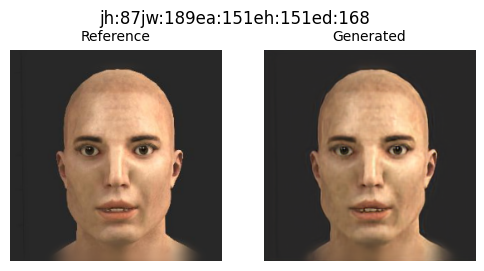

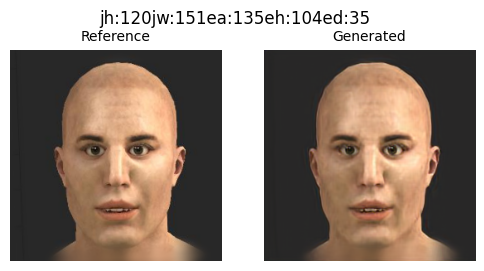

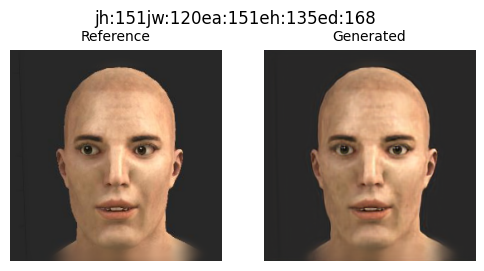

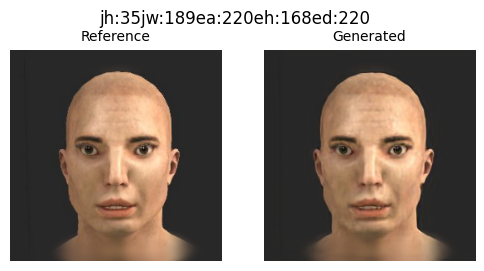

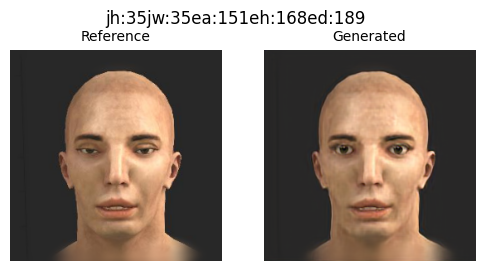

...

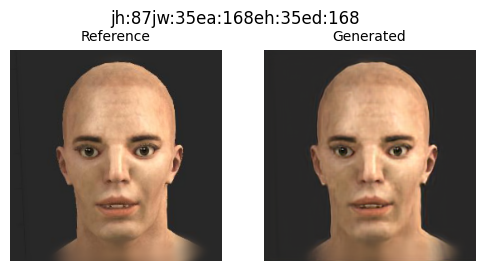

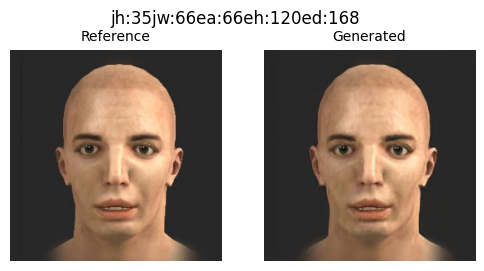

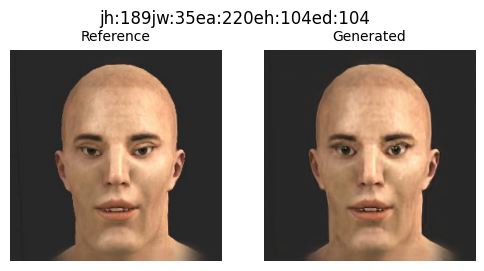

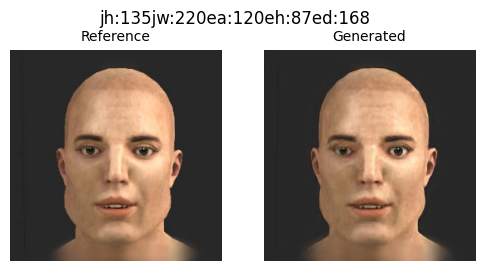

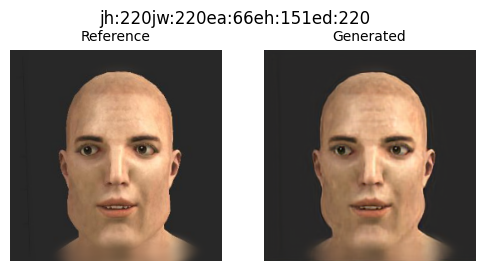

In [16]:
for x_ref, g_z, y_label_sample in zip(X_reference_test_sample, test_images_sample, labels_test_sample):
    plot_images_grid([x_ref, g_z], 1, 2, title=y_label_sample, subtitles=["Reference", "Generated"])
    plt.show()

Oh, this is interesting. For packages 20 and 30 almost every example here was bad. I suspect I have used a somehow different loss function or learning rate then. Now it looks decent. 

## So now the same but for the train set...

... but let's just look at first 100 packages, because my computer would crash if the whole dataset were loaded 

In [17]:

random_indicies = np.random.randint(0, Z_test.shape[0], 20)

Z_sample = Z[random_indicies]
generated_images_sample = prepare_images_for_plot(generate_images(generator, Z_sample))

Y_sample = Y[random_indicies]
labels_sample = create_labels(Y_sample)

X_reference_sample = [X_reference[i] for i in random_indicies]


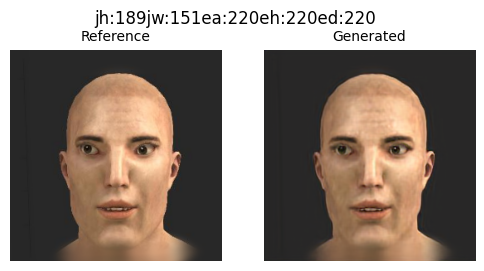

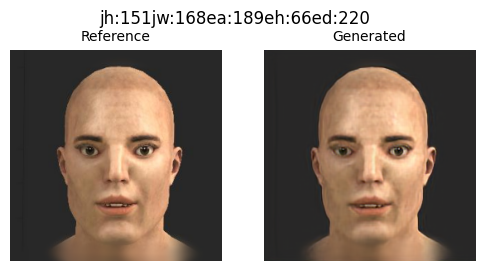

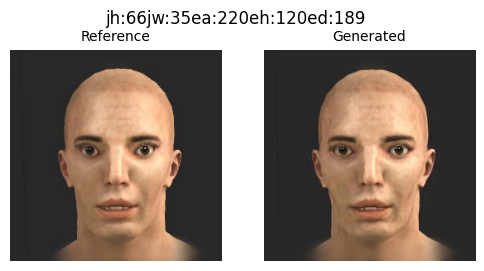

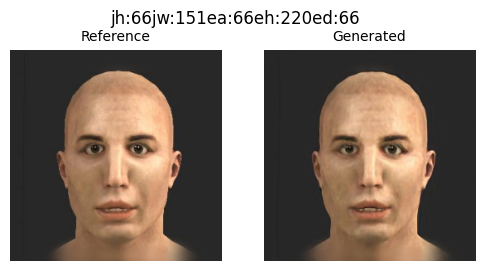

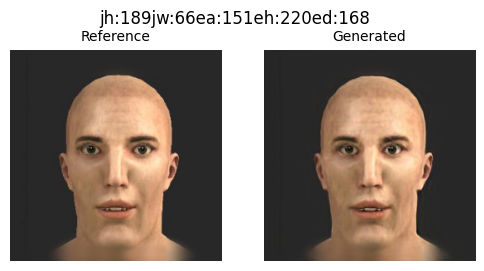

...

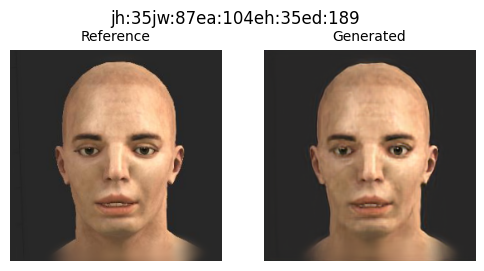

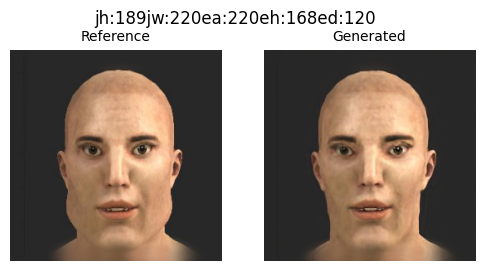

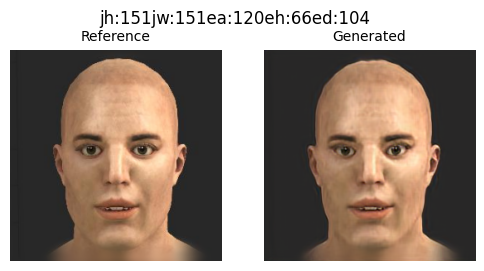

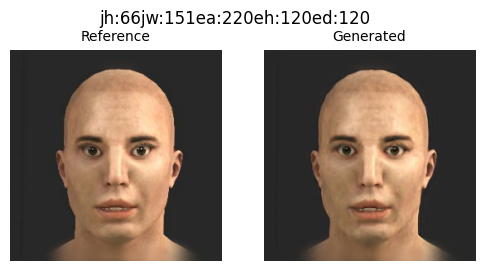

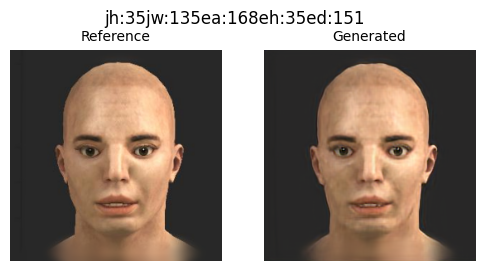

In [18]:
for x_ref, g_z, y_label_sample in zip(X_reference_sample, generated_images_sample, labels_sample):
    plot_images_grid([x_ref, g_z], 1, 2, title=y_label_sample, subtitles=["Reference", "Generated"])
    plt.show()
    

I am pleaseantly suprised. I thought it was going to be horrible but turned out to be decent. I think now training the encoder will go easier

## Encoders - finally!

I've been dealing with only this unpredictable dataset for a couple of hours now. I think I should get to the meat that is training the encoders. My plan is simple:
  1. Linear regression
  2. Random Forrest
  3. Kernel SVR
  4. MLP
  5. Pytorch dense layers with dropout

Then repeat everything but with PCAd data.

The only test for now is if we can get the validation and the test dataset through the encoders and get some results.

In [11]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline

predict_indicies_sample = np.random.randint(0, Z_val.shape[0], 10)

### Linear regression

In [19]:
# linear_regression_pipe = make_pipeline(StandardScaler(), LinearRegression())
# linear_regression_pipe.fit(Z, Y)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [20]:
# predicted = np.round(linear_regression_pipe.predict(Z_val[predict_indicies_sample]))
# real = Y_val[predict_indicies_sample]

# for pred, r in zip(predicted, real):
#     print(f"Predicted: {pred}, Real: {r}")

Predicted: [253. 224. 143. 108.  64.], Real: [220 220 189  87  66]
Predicted: [185.  38. 143. 152. 154.], Real: [189  66 151 151 189]
Predicted: [ 53. 157. 150. 211. 185.], Real: [ 66 151 151 220 189]
Predicted: [ 99. 113. 153. 175.  95.], Real: [ 66  87 168 189 120]
Predicted: [129. 166. 147. 134. 122.], Real: [120 189 151 168 120]
Predicted: [155. 144. 139. 206. 132.], Real: [168 135 135 220 104]
Predicted: [259. 236. 179. 128. 111.], Real: [220 220 189 151 104]
Predicted: [ 99.  77. 151. 152. 167.], Real: [ 87  66 168 168 220]
Predicted: [ 80. 147.  97. 161. 186.], Real: [ 66 168  87 151 220]
Predicted: [163. 112. 150. 100.  87.], Real: [168 104 168 104 104]


In [21]:
linear_regression_pipe.score(Z_val, Y_val), linear_regression_pipe.score(Z_test, Y_test)

(0.7499196394759122, 0.75330452798592)

### Random Forest

In [22]:
random_forrest_pipe = make_pipeline(StandardScaler(), RandomForestRegressor())
random_forrest_pipe.fit(Z[:10000], Y[:10000])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestregressor', RandomForestRegressor())])

In [23]:
predicted = np.round(random_forrest_pipe.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predicted, real):
    print(f"Predicted: {pred}, Real: {r}")

Predicted: [139. 123. 134. 134. 114.], Real: [220 220 189  87  66]
Predicted: [132. 123. 130. 125. 126.], Real: [189  66 151 151 189]
Predicted: [117. 133. 119. 136. 125.], Real: [ 66 151 151 220 189]
Predicted: [125. 121. 134. 123. 127.], Real: [ 66  87 168 189 120]
Predicted: [144. 139. 130. 131. 118.], Real: [120 189 151 168 120]
Predicted: [130. 140. 125. 147. 137.], Real: [168 135 135 220 104]
Predicted: [127. 142. 138. 116. 123.], Real: [220 220 189 151 104]
Predicted: [130. 110. 135. 133. 126.], Real: [ 87  66 168 168 220]
Predicted: [133.  98. 131. 134. 129.], Real: [ 66 168  87 151 220]
Predicted: [133. 120. 131. 120. 118.], Real: [168 104 168 104 104]


In [24]:
random_forrest_pipe.score(Z_val, Y_val), random_forrest_pipe.score(Z_test, Y_test)


(0.10304375776300893, 0.10356685641037464)

### SVR

In [25]:
svr_pipe = make_pipeline(StandardScaler(), MultiOutputRegressor(SVR(kernel='rbf')))
svr_pipe.fit(Z[:10000], Y[:10000])

predicted = np.round(svr_pipe.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predicted, real):
    print(f"Predicted: {pred}, Real: {r}")
    
print(f"SVR score on validation: {svr_pipe.score(Z_val, Y_val)}")
print(f"SVR score on test: {svr_pipe.score(Z_test, Y_test)}")



# for i, name in position_to_label.items():
#     print(f"Position {i}: {name}")
#     svr_pipe = make_pipeline(StandardScaler(), SVR(kernel='rbf'))
#     print(f"Training SVR for {name}")
#     svr_pipe.fit(Z[:1000], Y[:1000, i])
    
#     predicted = np.round(svr_pipe.predict(Z_val[predict_indicies_sample]))
#     real = Y_val[predict_indicies_sample][:, i]
#     for pred, r in zip(predicted, real):
#         print(f"Predicted: {pred}, Real: {r}")
        
#     print(f"SVR score on validation: {svr_pipe.score(Z_val, Y_val[:, i])}")
#     print(f"SVR score on test: {svr_pipe.score(Z_test, Y_test[:, i])}")
#     print("-----------------------")
    


Predicted: [148. 148. 130. 131. 113.], Real: [220 220 189  87  66]
Predicted: [140. 102. 130. 131. 134.], Real: [189  66 151 151 189]
Predicted: [120. 134. 129. 142. 133.], Real: [ 66 151 151 220 189]
Predicted: [124. 124. 132. 131. 119.], Real: [ 66  87 168 189 120]
Predicted: [134. 128. 130. 129. 125.], Real: [120 189 151 168 120]
Predicted: [135. 127. 125. 139. 128.], Real: [168 135 135 220 104]
Predicted: [147. 140. 132. 128. 125.], Real: [220 220 189 151 104]
Predicted: [122. 111. 131. 126. 138.], Real: [ 87  66 168 168 220]
Predicted: [119. 128. 123. 133. 139.], Real: [ 66 168  87 151 220]
Predicted: [132. 122. 130. 122. 118.], Real: [168 104 168 104 104]
SVR score on validation: 0.2173909374765312
SVR score on test: 0.22289043414364648


### MLP

In [26]:
MLP_pipe = make_pipeline(StandardScaler(), MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=1000, verbose=True))
MLP_pipe.fit(Z, Y)

Iteration 1, loss = 2220.59587676
Iteration 2, loss = 623.25117819
Iteration 3, loss = 498.16257217
Iteration 4, loss = 450.51399392
Iteration 5, loss = 420.82223196
Iteration 6, loss = 401.69888080
Iteration 7, loss = 387.11102812
Iteration 8, loss = 375.03714221
Iteration 9, loss = 364.73246125
Iteration 10, loss = 355.66885656
Iteration 11, loss = 347.79666347
Iteration 12, loss = 341.08822840
Iteration 13, loss = 335.14684803
Iteration 14, loss = 330.28303418
Iteration 15, loss = 325.80479740
Iteration 16, loss = 321.42263446
Iteration 17, loss = 317.98574069
Iteration 18, loss = 314.80232811
Iteration 19, loss = 311.72237906
Iteration 20, loss = 309.10460993
Iteration 21, loss = 306.34953537
Iteration 22, loss = 304.12679759
Iteration 23, loss = 302.01929766
Iteration 24, loss = 300.01421976
Iteration 25, loss = 298.10050328
Iteration 26, loss = 296.34783903
Iteration 27, loss = 294.66639269
Iteration 28, loss = 293.12095273
Iteration 29, loss = 291.25067222
Iteration 30, loss = 2

/home/pawel/Documents/studia/magisterka/CKTinderator/venv/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=1000,
                              verbose=True))])

In [ ]:
predicted = np.round(MLP_pipe.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predicted, real):
    print(f"Predicted: {pred}, Real: {r}")
    

Predicted: [161. 122. 170. 171. 113.], Real: [168 104 120 168 120]
Predicted: [109. 129. 156. 155.  67.], Real: [104 120 168 151  66]
Predicted: [ 92. 181. 171. 156. 101.], Real: [ 87 168 189 168 135]
Predicted: [153.  96. 230. 156. 140.], Real: [168  87 220 168 151]
Predicted: [223.  72.  63. 183.  16.], Real: [220  87  35 189  35]
Predicted: [133.  93. 112. 139. 110.], Real: [135  87 120 135 104]
Predicted: [ 89.  50. 176. 151. 165.], Real: [ 87  35 220 151 220]
Predicted: [ 87. 168. 197. 143.  78.], Real: [ 87 168 220 135  66]
Predicted: [ 41. 211.  67. 213. 142.], Real: [ 35 189  66 220 135]
Predicted: [215. 150.  87. 123. 207.], Real: [220 151  87 135  35]


In [ ]:
MLP_pipe.score(Z_val, Y_val), MLP_pipe.score(Z_test, Y_test)

(0.7453189553336144, 0.7431486051283104)

## PCA Pipelines!

In [20]:
from sklearn.decomposition import PCA

### linear regression + PCA

In [ ]:
linear_regression_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=16), LinearRegression())
linear_regression_pipe_pca.fit(Z, Y)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=16)),
                ('linearregression', LinearRegression())])

In [ ]:
predictions = np.round(linear_regression_pipe_pca.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")
    
linear_regression_pipe_pca.score(Z_val, Y_val), linear_regression_pipe_pca.score(Z_test, Y_test)

Predicted: [103. 134. 113. 140. 105.], Real: [168 104 120 168 120]
Predicted: [125. 169. 117. 171.  90.], Real: [104 120 168 151  66]
Predicted: [142. 159. 117. 199.  61.], Real: [ 87 168 189 168 135]
Predicted: [130. 112. 118. 138.  92.], Real: [168  87 220 168 151]
Predicted: [141. 133. 132. 149.  88.], Real: [220  87  35 189  35]
Predicted: [141. 118. 127. 176. 132.], Real: [135  87 120 135 104]
Predicted: [115.  87. 150. 118. 153.], Real: [ 87  35 220 151 220]
Predicted: [ 99. 139. 133. 154. 105.], Real: [ 87 168 220 135  66]
Predicted: [105. 173. 120. 193. 131.], Real: [ 35 189  66 220 135]
Predicted: [160. 105. 128. 125. 123.], Real: [220 151  87 135  35]


(0.30667289842407475, 0.32600250323517627)

### random forest + PCA

In [ ]:
random_forest_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=16), RandomForestRegressor())
random_forest_pipe_pca.fit(Z, Y)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=16)),
                ('randomforestregressor', RandomForestRegressor())])

In [ ]:
predictions = np.round(random_forest_pipe_pca.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")

Predicted: [113. 132. 141. 134.  99.], Real: [168 104 120 168 120]
Predicted: [131. 181. 119. 141.  78.], Real: [104 120 168 151  66]
Predicted: [132. 182. 119. 154.  80.], Real: [ 87 168 189 168 135]
Predicted: [133. 111. 142. 139.  98.], Real: [168  87 220 168 151]
Predicted: [139. 148. 121. 152. 103.], Real: [220  87  35 189  35]
Predicted: [139. 122. 124. 180. 150.], Real: [135  87 120 135 104]
Predicted: [120.  80. 148. 116. 149.], Real: [ 87  35 220 151 220]
Predicted: [ 97. 141. 112. 149. 103.], Real: [ 87 168 220 135  66]
Predicted: [118. 169. 127. 193. 102.], Real: [ 35 189  66 220 135]
Predicted: [170. 106. 138. 124. 112.], Real: [220 151  87 135  35]


In [ ]:
random_forest_pipe_pca.score(Z_val, Y_val), random_forest_pipe_pca.score(Z_test, Y_test)

(0.27935356581979603, 0.29197336670622354)

### SVR with PCA

In [ ]:
for i, name in position_to_label.items():
    print(f"Position {i}: {name}")
    svr_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=16), SVR(kernel='rbf'))
    print(f"Training SVR for {name}")
    svr_pipe_pca.fit(Z[:10000], Y[:10000, i])
    
    predictions = np.round(svr_pipe_pca.predict(Z_val[predict_indicies_sample]))
    real = Y_val[predict_indicies_sample][:, i]
    for pred, r in zip(predictions, real):
        print(f"Predicted: {pred}, Real: {r}")
        
    print(f"SVR score on validation: {svr_pipe_pca.score(Z_val, Y_val[:, i])}")
    print(f"SVR score on test: {svr_pipe_pca.score(Z_test, Y_test[:, i])}")
    print("-----------------------")

Position 0: gene_jaw_height
Training SVR for gene_jaw_height


Predicted: 112.0, Real: 168
Predicted: 127.0, Real: 104
Predicted: 119.0, Real: 87
Predicted: 144.0, Real: 168
Predicted: 148.0, Real: 220
Predicted: 110.0, Real: 135
Predicted: 134.0, Real: 87
Predicted: 90.0, Real: 87
Predicted: 121.0, Real: 35
Predicted: 149.0, Real: 220
SVR score on validation: 0.22179127408088106
SVR score on test: 0.21474458388968132
-----------------------
Position 1: gene_jaw_width
Training SVR for gene_jaw_width
Predicted: 144.0, Real: 104
Predicted: 180.0, Real: 120
Predicted: 146.0, Real: 168
Predicted: 129.0, Real: 87
Predicted: 124.0, Real: 87
Predicted: 138.0, Real: 87
Predicted: 96.0, Real: 35
Predicted: 150.0, Real: 168
Predicted: 173.0, Real: 189
Predicted: 92.0, Real: 151
SVR score on validation: 0.3570664679469
SVR score on test: 0.4106505542854758
-----------------------
Position 2: gene_eye_angle
Training SVR for gene_eye_angle
Predicted: 124.0, Real: 120
Predicted: 123.0, Real: 168
Predicted: 129.0, Real: 189
Predicted: 144.0, Real: 220
Predicted:

### MLP with PCA

In [ ]:
MLP_pipeline_pca = make_pipeline(StandardScaler(), PCA(n_components=16), MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=1000, verbose=True))
MLP_pipeline_pca.fit(Z, Y)

Iteration 1, loss = 3321.08209050
Iteration 2, loss = 1188.42719444
Iteration 3, loss = 1126.54654026
Iteration 4, loss = 1085.40242507
Iteration 5, loss = 1056.00831374
Iteration 6, loss = 1040.83831508
Iteration 7, loss = 1034.44930511
Iteration 8, loss = 1031.26562775
Iteration 9, loss = 1029.24446675
Iteration 10, loss = 1028.32593500
Iteration 11, loss = 1027.16801423
Iteration 12, loss = 1026.46501267
Iteration 13, loss = 1025.67233019
Iteration 14, loss = 1025.12577158
Iteration 15, loss = 1024.81868518
Iteration 16, loss = 1023.95189631
Iteration 17, loss = 1023.66437792
Iteration 18, loss = 1023.45657176
Iteration 19, loss = 1023.11690067
Iteration 20, loss = 1022.59214297
Iteration 21, loss = 1022.55478515
Iteration 22, loss = 1021.93446378
Iteration 23, loss = 1021.60472242
Iteration 24, loss = 1021.38803185
Iteration 25, loss = 1021.21209651
Iteration 26, loss = 1020.80000085
Iteration 27, loss = 1020.68322304
Iteration 28, loss = 1020.33084376
Iteration 29, loss = 1020.308

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=16)),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=1000,
                              verbose=True))])

In [ ]:
predictions = np.round(MLP_pipeline_pca.predict(Z_val[predict_indicies_sample]))
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")

Predicted: [ 99. 144. 120. 144. 121.], Real: [168 104 120 168 120]
Predicted: [116. 169. 120. 154.  75.], Real: [104 120 168 151  66]
Predicted: [126. 182. 122. 129.  79.], Real: [ 87 168 189 168 135]
Predicted: [116. 109. 129. 136.  99.], Real: [168  87 220 168 151]
Predicted: [131. 129. 136. 151.  86.], Real: [220  87  35 189  35]
Predicted: [141. 117. 143. 179. 141.], Real: [135  87 120 135 104]
Predicted: [144.  85. 144.  88. 152.], Real: [ 87  35 220 151 220]
Predicted: [ 86. 159. 118. 149.  94.], Real: [ 87 168 220 135  66]
Predicted: [120. 174. 126. 187. 113.], Real: [ 35 189  66 220 135]
Predicted: [160. 105. 120. 152. 116.], Real: [220 151  87 135  35]


In [ ]:
MLP_pipeline_pca.score(Z_val, Y_val), MLP_pipeline_pca.score(Z_test, Y_test)

(0.3234793627626953, 0.3313334335073778)

In [ ]:
linear_regression_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=64), LinearRegression())
linear_regression_pipe_pca.fit(Z, Y)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=64)),
                ('linearregression', LinearRegression())])

In [ ]:
predictions = np.round(linear_regression_pipe_pca.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")
    
linear_regression_pipe_pca.score(Z_val, Y_val), linear_regression_pipe_pca.score(Z_test, Y_test)

Predicted: [102. 130. 116. 136. 115.], Real: [168 104 120 168 120]
Predicted: [115. 136. 146. 161.  86.], Real: [104 120 168 151  66]
Predicted: [132. 143. 104. 192.  63.], Real: [ 87 168 189 168 135]
Predicted: [138. 119. 117. 166. 112.], Real: [168  87 220 168 151]
Predicted: [120. 122. 127. 165. 104.], Real: [220  87  35 189  35]
Predicted: [110. 108. 142. 194. 131.], Real: [135  87 120 135 104]
Predicted: [108.  84. 175.  97. 135.], Real: [ 87  35 220 151 220]
Predicted: [109. 137. 141. 155. 104.], Real: [ 87 168 220 135  66]
Predicted: [104. 168. 135. 167. 109.], Real: [ 35 189  66 220 135]
Predicted: [175. 116. 128. 135. 129.], Real: [220 151  87 135  35]


(0.34248604191577836, 0.3593912434356157)

### random forest + PCA

In [ ]:
random_forest_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=128), RandomForestRegressor())
random_forest_pipe_pca.fit(Z, Y)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=128)),
                ('randomforestregressor', RandomForestRegressor())])

In [ ]:
predictions = np.round(random_forest_pipe_pca.predict(Z_val[predict_indicies_sample]))
real = Y_val[predict_indicies_sample]
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")

Predicted: [107. 145. 129. 135. 101.], Real: [168 104 120 168 120]
Predicted: [123. 171. 124. 166.  94.], Real: [104 120 168 151  66]
Predicted: [125. 179. 115. 156.  98.], Real: [ 87 168 189 168 135]
Predicted: [118. 116. 132. 147. 100.], Real: [168  87 220 168 151]
Predicted: [144. 132. 121. 160. 104.], Real: [220  87  35 189  35]
Predicted: [140. 130. 129. 182. 141.], Real: [135  87 120 135 104]
Predicted: [132.  85. 146. 119. 160.], Real: [ 87  35 220 151 220]
Predicted: [ 95. 138. 128. 154. 117.], Real: [ 87 168 220 135  66]
Predicted: [119. 160. 120. 189. 116.], Real: [ 35 189  66 220 135]
Predicted: [170. 100. 138. 118. 115.], Real: [220 151  87 135  35]


In [ ]:
random_forest_pipe_pca.score(Z_val, Y_val), random_forest_pipe_pca.score(Z_test, Y_test)

(0.2995287264029264, 0.31557465671245116)

### SVR with PCA

In [ ]:
for i, name in position_to_label.items():
    print(f"Position {i}: {name}")
    svr_pipe_pca = make_pipeline(StandardScaler(), PCA(n_components=64), SVR(kernel='rbf'))
    print(f"Training SVR for {name}")
    svr_pipe_pca.fit(Z[:10000], Y[:10000, i])
    
    predictions = np.round(svr_pipe_pca.predict(Z_val[predict_indicies_sample]))
    real = Y_val[predict_indicies_sample][:, i]
    for pred, r in zip(predictions, real):
        print(f"Predicted: {pred}, Real: {r}")
        
    print(f"SVR score on validation: {svr_pipe_pca.score(Z_val, Y_val[:, i])}")
    print(f"SVR score on test: {svr_pipe_pca.score(Z_test, Y_test[:, i])}")
    print("-----------------------")

Position 0: gene_jaw_height
Training SVR for gene_jaw_height
Predicted: 117.0, Real: 168
Predicted: 124.0, Real: 104
Predicted: 119.0, Real: 87
Predicted: 123.0, Real: 168
Predicted: 137.0, Real: 220
Predicted: 119.0, Real: 135
Predicted: 137.0, Real: 87
Predicted: 104.0, Real: 87
Predicted: 122.0, Real: 35
Predicted: 139.0, Real: 220
SVR score on validation: 0.23073893186619177
SVR score on test: 0.21225574912526535
-----------------------
Position 1: gene_jaw_width
Training SVR for gene_jaw_width
Predicted: 129.0, Real: 104
Predicted: 165.0, Real: 120
Predicted: 141.0, Real: 168
Predicted: 123.0, Real: 87
Predicted: 139.0, Real: 87
Predicted: 127.0, Real: 87
Predicted: 103.0, Real: 35
Predicted: 136.0, Real: 168
Predicted: 156.0, Real: 189
Predicted: 108.0, Real: 151
SVR score on validation: 0.35496910193455977
SVR score on test: 0.41430934375666895
-----------------------
Position 2: gene_eye_angle
Training SVR for gene_eye_angle
Predicted: 115.0, Real: 120
Predicted: 132.0, Real: 1

### MLP with PCA

In [ ]:
MLP_pipeline_pca = make_pipeline(StandardScaler(), PCA(n_components=128), MLPRegressor(hidden_layer_sizes=(64, 32), max_iter=1000, verbose=True))
MLP_pipeline_pca.fit(Z, Y)

Iteration 1, loss = 3562.99192120
Iteration 2, loss = 1325.58221467
Iteration 3, loss = 1146.12991843
Iteration 4, loss = 1031.93784534
Iteration 5, loss = 993.87492847
Iteration 6, loss = 977.56420240
Iteration 7, loss = 965.16837293
Iteration 8, loss = 954.73882554
Iteration 9, loss = 945.45424238
Iteration 10, loss = 938.06408049
Iteration 11, loss = 931.35810351
Iteration 12, loss = 926.04751571
Iteration 13, loss = 921.62473765
Iteration 14, loss = 917.59257927
Iteration 15, loss = 914.11905580
Iteration 16, loss = 910.93470027
Iteration 17, loss = 908.27329570
Iteration 18, loss = 905.74080825
Iteration 19, loss = 903.27731071
Iteration 20, loss = 900.98757526
Iteration 21, loss = 898.50657955
Iteration 22, loss = 896.64134354
Iteration 23, loss = 895.06083555
Iteration 24, loss = 893.36343017
Iteration 25, loss = 892.17929286
Iteration 26, loss = 890.89588868
Iteration 27, loss = 889.92687224
Iteration 28, loss = 888.85581257
Iteration 29, loss = 888.20256327
Iteration 30, loss 

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=128)),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=(64, 32), max_iter=1000,
                              verbose=True))])

In [ ]:
predictions = np.round(MLP_pipeline_pca.predict(Z_val[predict_indicies_sample]))
for pred, r in zip(predictions, real):
    print(f"Predicted: {pred}, Real: {r}")

Predicted: [ 99. 135. 114. 136. 117.], Real: 120
Predicted: [114. 134. 154. 141.  83.], Real: 66
Predicted: [103. 210. 118. 100. 105.], Real: 135
Predicted: [155.  82. 125. 156. 103.], Real: 151
Predicted: [175.  99. 143. 162.  22.], Real: 35
Predicted: [139. 102. 118. 203. 117.], Real: 104
Predicted: [121.  66. 209. 120. 152.], Real: 220
Predicted: [ 78. 149. 159. 163. 122.], Real: 66
Predicted: [100. 152. 117. 160.  96.], Real: 135
Predicted: [140.  98. 156. 127. 129.], Real: 35


In [ ]:
MLP_pipeline_pca.score(Z_val, Y_val), MLP_pipeline_pca.score(Z_test, Y_test)

(0.3876183608466902, 0.3994931022190017)

In [12]:
from joblib import dump, load

# regressors = [
#     LinearRegression(),
#     RandomForestRegressor(),
#     MultiOutputRegressor(SVR(kernel='rbf')),
#     MLPRegressor(hidden_layer_sizes=(128, 64), max_iter=1000)
# ]

# for size in range(10000, 80001, 10000):
#     for regressor in regressors:
#         regressor_name = regressor.__class__.__name__
#         print(f"Training regressor {regressor_name} for {size} samples")
#         regressor_standard_pipe = make_pipeline(StandardScaler(), regressor)
#         regressor_standard_pipe.fit(Z[:size], Y[:size])
#         print(f"Saving regressor for {size} samples")
#         dump(regressor_standard_pipe, f"regressors/{regressor_name}_{size}_Z.joblib")
        
#         for i in [16, 32, 64, 128]:
#             print(f"PCA with n_components = {i}")
#             regressor_pca_pipe = make_pipeline(StandardScaler(), PCA(n_components=i), regressor)
#             regressor_pca_pipe.fit(Z[:size], Y[:size])
#             print(f"Saving regressor for {size} samples with PCA with n_components = {i}")
#             dump(regressor_pca_pipe, f"regressors/{regressor_name}_{size}_Z_pca_{i}.joblib")


In [13]:
regressors = [
    MultiOutputRegressor(SVR(kernel='rbf'))
]


for size in range(70000, 100001, 10000):
    for regressor in regressors:
        regressor_name = regressor.__class__.__name__
        print(f"Training regressor {regressor_name} for {size} samples")
        regressor_standard_pipe = make_pipeline(StandardScaler(), regressor)
        regressor_standard_pipe.fit(Z[:size], Y[:size])
        print(f"Saving regressor for {size} samples")
        dump(regressor_standard_pipe, f"regressors/{regressor_name}_{size}_Z.joblib")



Training regressor MultiOutputRegressor for 70000 samples
Saving regressor for 70000 samples
Training regressor MultiOutputRegressor for 80000 samples
Saving regressor for 80000 samples
Training regressor MultiOutputRegressor for 90000 samples
Saving regressor for 90000 samples
Training regressor MultiOutputRegressor for 100000 samples
Saving regressor for 100000 samples


In [29]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

print("Linear regression")
linear_regressors = [load(f"regressors/LinearRegression_{size}_Z.joblib") for size in range(10000, 100001, 10000)]
for linear_regressor in linear_regressors:
    for Z, Y, name in [(Z_val, Y_val, "Validation"), (Z_test, Y_test, "Test")]:
        predictions = linear_regressor.predict(Z)
        mse = mean_squared_error(Y, predictions)
        mae = mean_absolute_error(Y, predictions)
        r2 = linear_regressor.score(Z, Y)
        print(f"MSE: {mse}, MAE: {mae}, R2: {r2}")

print("-------------------------------------------------")
print("MLP Regressor")
mlp_regressors = [load(f"regressors/MLPRegressor_{size}_Z.joblib") for size in range(10000, 100001, 10000)]
for mlp_regressor in mlp_regressors:
    for Z, Y, name in [(Z_val, Y_val, "Validation"), (Z_test, Y_test, "Test")]:
        
        predictions = mlp_regressor.predict(Z)
        mse = mean_squared_error(Y, predictions)
        mae = mean_absolute_error(Y, predictions)
        r2 = mlp_regressor.score(Z, Y)
        print(f"MSE: {mse}, MAE: {mae}, R2: {r2}")
        
        

Linear regression
MSE: 799.863661950791, MAE: 20.62177931213379, R2: 0.7264546397806859
MSE: 806.5603711850515, MAE: 20.772044639587403, R2: 0.7294016001943957
MSE: 795.0795626474694, MAE: 20.478252182006834, R2: 0.7281376344274468
MSE: 800.1290756722508, MAE: 20.69615619888306, R2: 0.7316153634183601


MSE: 759.8870439850913, MAE: 19.914434580993653, R2: 0.7401797808246023
MSE: 763.2209278862183, MAE: 20.124392572784423, R2: 0.7440370263247632
MSE: 764.3940144494594, MAE: 20.010347495269777, R2: 0.738635611385412
MSE: 768.9926092527385, MAE: 20.213958112335206, R2: 0.7420894185673946
MSE: 766.5985448043111, MAE: 20.0555675239563, R2: 0.7378891359740939
MSE: 772.5794978726328, MAE: 20.272899182128903, R2: 0.7408832507554031
MSE: 768.607673490202, MAE: 20.094731687927247, R2: 0.7372066051526058
MSE: 773.5876147404202, MAE: 20.29164725189209, R2: 0.7405389737871966
MSE: 752.9817448574235, MAE: 19.842953663635253, R2: 0.7425494249261988
MSE: 757.8348713305259, MAE: 20.027517185211185, R2: 0.7458459164997238
MSE: 741.456080759457, MAE: 19.656685839080808, R2: 0.746481242075079
MSE: 746.6852753372872, MAE: 19.832672401428223, R2: 0.7496000443053903
MSE: 736.7451513266291, MAE: 19.56725023880005, R2: 0.7480966466646055
MSE: 741.706480623269, MAE: 19.739920629882814, R2: 0.7512782468145126
M

In [90]:
from scipy import stats


# forest_regressor = load("regressors/MultiOutputRegressor_60000_Z.joblib")
predictions = mlp_regressor.predict(Z_test)
stats.kstest(Y_test[:, 4], predictions[:, 4]).pvalue

0.0028179208242694134

In [57]:
sample1 = np.random.normal(loc=0, scale=1, size=100)

sample2 = np.random.normal(loc=0, scale=1, size=100)

stats.kstest(sample1, sample2)

KstestResult(statistic=0.12, pvalue=0.469506448503778, statistic_location=-0.1092016348602533, statistic_sign=1)